In [1]:
import os
from os.path import join
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms, datasets
from torchvision.utils import make_grid
from tqdm.auto import tqdm, trange
from einops import rearrange, repeat
from circuit_toolkit.plot_utils import to_imgrid
import sys
sys.path.append("/n/home12/binxuwang/Github/DiT")
from models import DiT_models
from diffusion import create_diffusion
from diffusers.models import AutoencoderKL

/n/home12/binxuwang/.conda/envs/torch2/lib/python3.10/site-packages/transformers/utils/hub.py:127: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(


### Loading and sampling from trained models

In [2]:
vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-ema")
vae.eval()
vae.to("cuda")
vae.requires_grad_(False);

In [3]:
def vae_decode_batch(vae, latents, batch_size=8):
    samples = []
    for i in trange(0, len(latents), batch_size):
        samples.append(vae.decode(latents[i:i+batch_size].to(vae.device) / 0.18215).sample)
    pred_x0_traj = torch.cat(samples, dim=0)
    pred_x0_traj = (0.5 * pred_x0_traj + 0.5).clamp(0, 1)
    return pred_x0_traj
    

In [4]:
latent_size = 16
num_classes = 0
class_dropout_prob = 1.0

model = DiT_models["DiT-S/1"](
        input_size=latent_size,
        in_channels=4,
        num_classes=num_classes,
        class_dropout_prob=class_dropout_prob
    )

In [5]:
exproot = r"/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionAttnConsistency/DiT/flowers_results/005-flower_latents10k_pilots-uncond-DiT-S-1-flower_latents10k_pilots_20250624-1512"
ckptdir = join(exproot, "checkpoints")
sample_dir = join(exproot, "samples")
model.load_state_dict(torch.load(join(ckptdir, "0070000.pt"))["ema"]);

model.to("cuda")
model.eval()
model.requires_grad_(False);

In [6]:
diffusion_eval = create_diffusion(timestep_respacing="ddim100")  # default: ddim100, linear noise schedule

  0%|          | 0/100 [00:00<?, ?it/s]

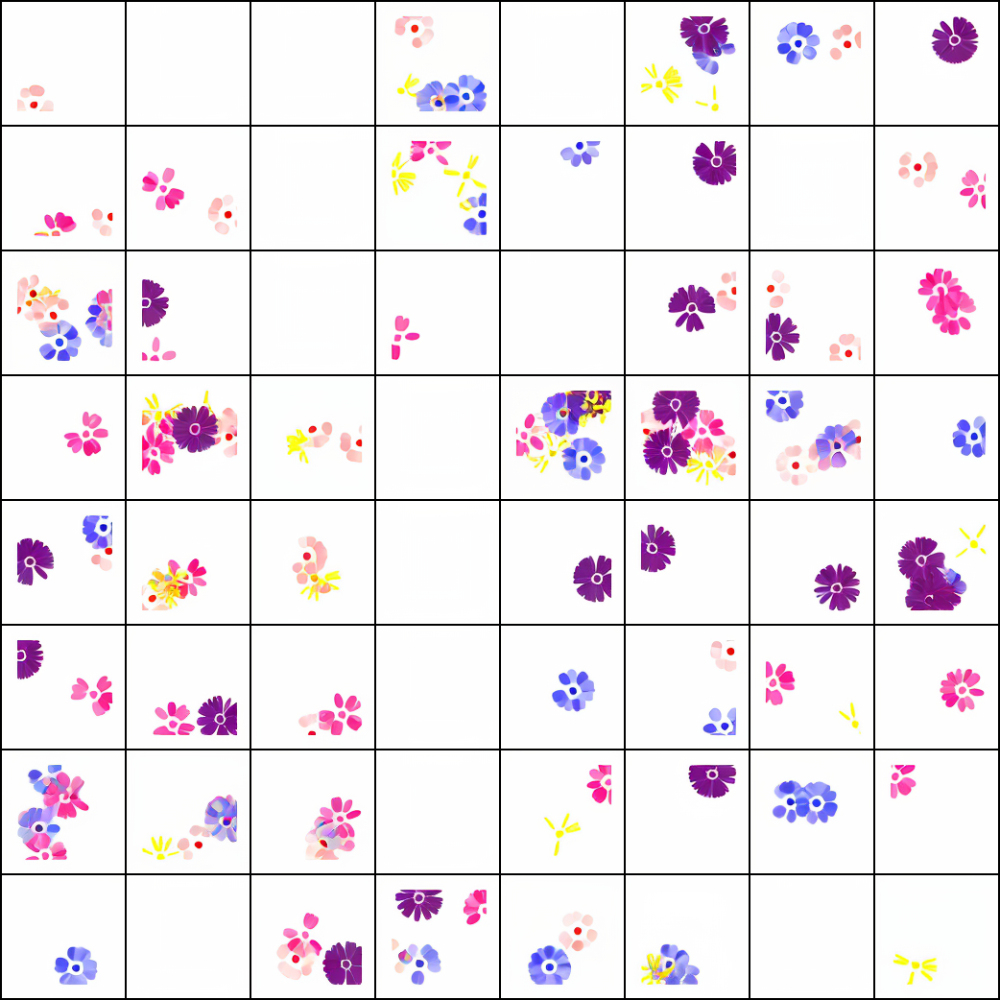

In [7]:
z = torch.randn(64, 4, 16, 16, device="cuda")
model_kwargs = {"y": torch.zeros(64, dtype=torch.int, device="cuda")}
device = "cuda"
diffusion_eval = create_diffusion(timestep_respacing="ddim100")  # default: ddim100, linear noise schedule
with torch.no_grad():
    latents = diffusion_eval.ddim_sample_loop(
        model.forward, z.shape, z, clip_denoised=False, model_kwargs=model_kwargs, progress=True, device=device
)
samples = vae.decode(latents / 0.18215).sample.cpu()
samples = (0.5 * samples + 0.5).clamp(0, 1)
to_imgrid(samples, nrow=8)

### Record the intermediate steps of diffusion sampling (Xt and pred x0)

In [58]:
diffusion_eval = create_diffusion(timestep_respacing="ddim50")


In [59]:
final = None
batch_size = 8
z = torch.randn(batch_size, 4, 16, 16, device="cuda")
model_kwargs = {"y": torch.zeros(batch_size, dtype=torch.int, device="cuda")}
intermediate_Xt = []
intermediate_pred_x0 = []
intermediate_Xt.append(z.clone().cpu())
for sample in diffusion_eval.ddim_sample_loop_progressive(
    model,
    z.shape,
    z,
    clip_denoised=False,
    denoised_fn=None,
    cond_fn=None,
    model_kwargs=model_kwargs,
    device=device,
    progress=True,
    eta=0.0,
):
    final = sample
    intermediate_Xt.append(sample["sample"].cpu())
    intermediate_pred_x0.append(sample["pred_xstart"].cpu())

intermediate_Xt = torch.stack(intermediate_Xt)
intermediate_pred_x0 = torch.stack(intermediate_pred_x0)
final["sample"];

  0%|          | 0/50 [00:00<?, ?it/s]

In [60]:
intermediate_Xt.shape

torch.Size([51, 8, 4, 16, 16])

In [65]:
pred_x0_traj = vae_decode_batch(vae, intermediate_pred_x0[:,4], batch_size=64)
xt_traj = vae_decode_batch(vae, intermediate_Xt[:,4], batch_size=64)

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

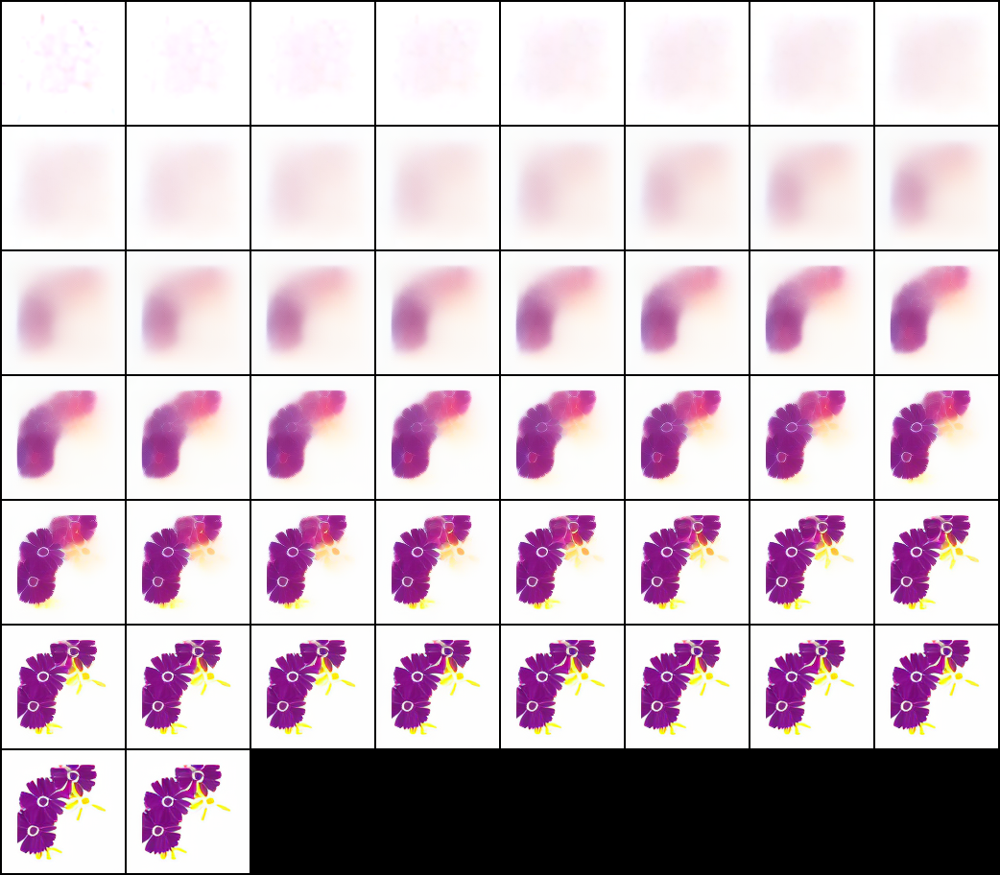

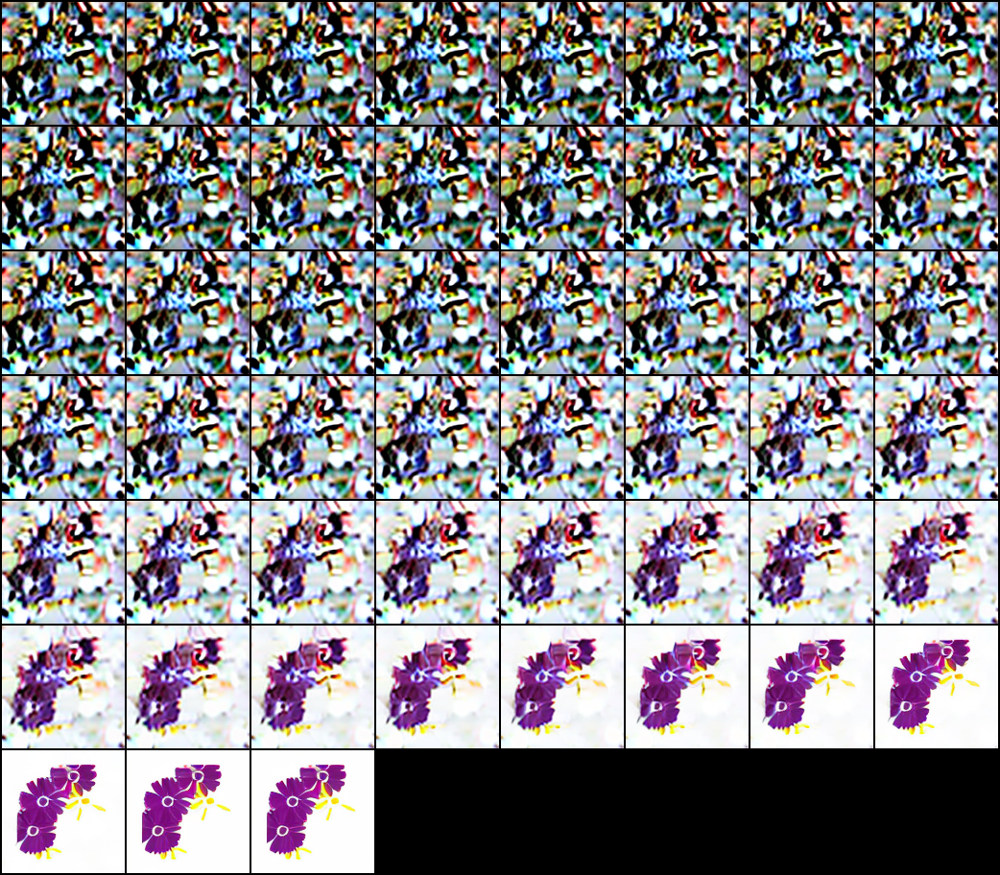

In [68]:
display(to_imgrid(pred_x0_traj))
display(to_imgrid(xt_traj))

### Examine the attention structure of one run

#### Inspecting the attention function

In [70]:
model.blocks[0].attn

Attention(
  (qkv): Linear(in_features=384, out_features=1152, bias=True)
  (q_norm): Identity()
  (k_norm): Identity()
  (attn_drop): Dropout(p=0.0, inplace=False)
  (proj): Linear(in_features=384, out_features=384, bias=True)
  (proj_drop): Dropout(p=0.0, inplace=False)
)

In [72]:
type(model.blocks[0].attn)

timm.models.vision_transformer.Attention

In [74]:
from inspect import getmembers, isfunction, getsource
print(getsource(model.blocks[0].attn.forward))

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        B, N, C = x.shape
        qkv = self.qkv(x).reshape(B, N, 3, self.num_heads, self.head_dim).permute(2, 0, 3, 1, 4)
        q, k, v = qkv.unbind(0)
        q, k = self.q_norm(q), self.k_norm(k)

        if self.fused_attn:
            x = F.scaled_dot_product_attention(
                q, k, v,
                dropout_p=self.attn_drop.p if self.training else 0.,
            )
        else:
            q = q * self.scale
            attn = q @ k.transpose(-2, -1)
            attn = attn.softmax(dim=-1)
            attn = self.attn_drop(attn)
            x = attn @ v

        x = x.transpose(1, 2).reshape(B, N, C)
        x = self.proj(x)
        x = self.proj_drop(x)
        return x



#### Hook the attention drop function

In [14]:
from copy import deepcopy
from collections import defaultdict
from circuit_toolkit.layer_hook_utils import featureFetcher_module

In [11]:
def toggle_fused_attn(model, fused_attn=True):
    for block in model.blocks:
        block.attn.fused_attn = fused_attn
    print(f"Fused attn turned {fused_attn}")
    return model


toggle_fused_attn(model, fused_attn=False);

Fused attn turned False


In [13]:
toggle_fused_attn(model, fused_attn=False);
fetcher = featureFetcher_module()
for blocki, block in enumerate(model.blocks):
    fetcher.record_module(block.attn.attn_drop, f"attn_{blocki}", store_device="cpu")

z = torch.randn(8, 4, 16, 16, device="cuda", generator=torch.Generator(device="cuda").manual_seed(0))
model.forward(z, t=torch.randn(z.shape[0], device="cuda"), y=torch.zeros(z.shape[0], dtype=torch.int, device="cuda"));
for key in fetcher.activations.keys():
    print(key, fetcher.activations[key].shape)

Fused attn turned False
attn_0 torch.Size([8, 6, 256, 256])
attn_1 torch.Size([8, 6, 256, 256])
attn_2 torch.Size([8, 6, 256, 256])
attn_3 torch.Size([8, 6, 256, 256])
attn_4 torch.Size([8, 6, 256, 256])
attn_5 torch.Size([8, 6, 256, 256])
attn_6 torch.Size([8, 6, 256, 256])
attn_7 torch.Size([8, 6, 256, 256])
attn_8 torch.Size([8, 6, 256, 256])
attn_9 torch.Size([8, 6, 256, 256])
attn_10 torch.Size([8, 6, 256, 256])
attn_11 torch.Size([8, 6, 256, 256])


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

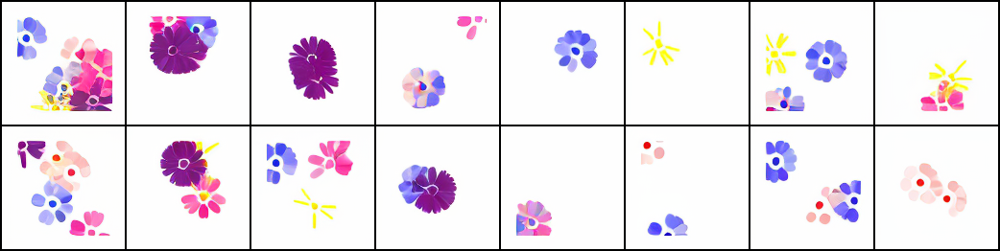

In [18]:
diffusion_eval = create_diffusion(timestep_respacing="ddim20")
final = None
batch_size = 16
z = torch.randn(batch_size, 4, 16, 16, device="cuda", 
                generator=torch.Generator(device="cuda").manual_seed(0))
model_kwargs = {"y": torch.zeros(batch_size, dtype=torch.int, device="cuda")}
intermediate_Xt = []
intermediate_pred_x0 = []
intermediate_Xt.append(z.clone().cpu())
attn_maps_organized = defaultdict(list)
for sample in diffusion_eval.ddim_sample_loop_progressive(
    model.forward,
    z.shape,
    z,
    clip_denoised=False,
    denoised_fn=None,
    cond_fn=None,
    model_kwargs=model_kwargs,
    device=device,
    progress=True,
    eta=0.0,
):
    final = sample
    intermediate_Xt.append(sample["sample"].cpu())
    intermediate_pred_x0.append(sample["pred_xstart"].cpu())
    # attn_maps.append(deepcopy(fetcher.activations))
    for key in fetcher.activations.keys():
        attn_maps_organized[key].append(fetcher.activations[key].clone().cpu())
intermediate_Xt = torch.stack(intermediate_Xt)
intermediate_pred_x0 = torch.stack(intermediate_pred_x0)
attn_maps_organized = {key: torch.stack(attn_maps_organized[key]) for key in attn_maps_organized.keys()}
to_imgrid(vae_decode_batch(vae, final["sample"]))

In [159]:
images = vae.decode(final["sample"].cuda()/0.18215).sample.cpu()
images = (images/2+0.5).clamp(0,1)

In [24]:
for key in attn_maps_organized.keys():
    print(key, attn_maps_organized[key].shape) # (num_sampling_steps, batch_size, num_heads, num_tokens, num_tokens)
attn_maps_stacked = torch.stack(list(attn_maps_organized.values()))
print("attn_maps_stacked.shape:", attn_maps_stacked.shape) # (num_layers, num_sampling_steps, batch_size, num_heads, num_tokens, num_tokens)
# make sure each attention map sums to 1
assert torch.allclose(attn_maps_organized["attn_11"].sum(dim=-1), torch.ones(1))
# make sure different time steps have different attn maps (not overwritten)
assert not torch.allclose(attn_maps_organized["attn_11"][0], attn_maps_organized["attn_11"][-1])
assert not torch.allclose(attn_maps_organized["attn_1"][0], attn_maps_organized["attn_11"][-1])

attn_0 torch.Size([20, 16, 6, 256, 256])
attn_1 torch.Size([20, 16, 6, 256, 256])
attn_2 torch.Size([20, 16, 6, 256, 256])
attn_3 torch.Size([20, 16, 6, 256, 256])
attn_4 torch.Size([20, 16, 6, 256, 256])
attn_5 torch.Size([20, 16, 6, 256, 256])
attn_6 torch.Size([20, 16, 6, 256, 256])
attn_7 torch.Size([20, 16, 6, 256, 256])
attn_8 torch.Size([20, 16, 6, 256, 256])
attn_9 torch.Size([20, 16, 6, 256, 256])
attn_10 torch.Size([20, 16, 6, 256, 256])
attn_11 torch.Size([20, 16, 6, 256, 256])
attn_maps_stacked.shape: torch.Size([12, 20, 16, 6, 256, 256])


In [25]:
if False:
    layer_keys = list(attn_maps[0].keys())
    attn_maps_organized = {key: [] for key in layer_keys}
    for sampling_step in range(len(attn_maps)):
        for key in layer_keys:
            attn_maps_organized[key].append(attn_maps[sampling_step][key])
    attn_maps_stacked = []
    for key in layer_keys:
        attn_maps_organized[key] = torch.stack(attn_maps_organized[key])
        attn_maps_stacked.append(attn_maps_organized[key])
        print(key, attn_maps_organized[key].shape) # (num_sampling_steps, batch_size, num_heads, num_tokens, num_tokens)
    attn_maps_stacked = torch.stack(attn_maps_stacked)
    print("attn_maps_stacked.shape:", attn_maps_stacked.shape) # (num_layers, num_sampling_steps, batch_size, num_heads, num_tokens, num_tokens)
    # make sure each attention map sums to 1
    assert torch.allclose(attn_maps_stacked[0,0,0,0,:,:].sum(dim=1), torch.ones(1))
    # make sure different time steps have different attn maps (not overwritten)
    assert not torch.allclose(attn_maps_organized["attn_11"][0], attn_maps_organized["attn_11"][-1])
    assert not torch.allclose(attn_maps_organized["attn_1"][0], attn_maps_organized["attn_11"][-1])

### Visualize attention maps

In [156]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

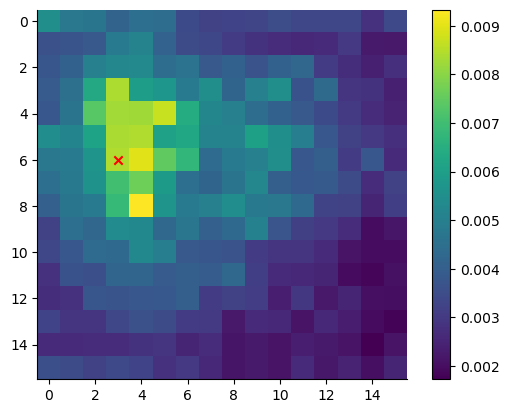

In [189]:
def visualize_attn_map(attn_maps_stacked, layer_idx, step_idx, sample_idx, head_idx, token_idx, map_shape=(16, 16), use_heatmap=False):
    """
    attn_maps_stacked has shape (num_layers, num_steps, num_samples, num_heads, num_tokens, num_tokens)
    """
    n_layers, n_steps, n_samples, n_heads, n_tokens, _ = attn_maps_stacked.shape
    H_idx, W_idx = np.unravel_index(token_idx, map_shape)
    if use_heatmap:
        H_idx = H_idx + 0.5
        W_idx = W_idx + 0.5
    if head_idx is not None:
        if use_heatmap:
            sns.heatmap(attn_maps_stacked[layer_idx,step_idx,sample_idx,head_idx,token_idx,:].reshape(map_shape), cmap="viridis", cbar=True)
        else:
            im = plt.imshow(attn_maps_stacked[layer_idx,step_idx,sample_idx,head_idx,token_idx,:].reshape(map_shape), cmap="viridis")
            # colorbar
            cbar = plt.colorbar(im, ax=plt.gca())
            # cbar.ax.set_ylabel("Attention Weight", rotation=-90, va="bottom")
        plt.scatter(W_idx, H_idx, color="red", marker="x")
        return plt.gcf()
    elif head_idx is None:
        if layer_idx is not None and step_idx is not None:
            # plot all heads for a given layer and step
            figh, axs = plt.subplots(2, 3, figsize=(12, 8), sharex=True, sharey=True)
            axs = axs.flatten()
            for head_idx in range(n_heads):
                if use_heatmap:
                    sns.heatmap(attn_maps_stacked[layer_idx,step_idx,sample_idx,head_idx,token_idx,:].reshape(map_shape), cmap="viridis", ax=axs[head_idx], cbar=True)
                else:
                    im = axs[head_idx].imshow(attn_maps_stacked[layer_idx,step_idx,sample_idx,head_idx,token_idx,:].reshape(map_shape), cmap="viridis")
                    # colorbar
                    cbar = axs[head_idx].figure.colorbar(im, ax=axs[head_idx])
                    # cbar.ax.set_ylabel("Attention Weight", rotation=-90, va="bottom")
                axs[head_idx].scatter(W_idx, H_idx, color="red", marker="x")
                axs[head_idx].set_title(f"Head {head_idx}")
                axs[head_idx].set_aspect("equal")
            plt.suptitle(f"Layer{layer_idx}, Step{step_idx}, Sample{sample_idx}, Token{token_idx} | all heads")
        elif layer_idx is None and step_idx is not None:
            # plot all layers heads for a given step
            figh, axs = plt.subplots(n_layers, n_heads, figsize=(15, 30), sharex=True, sharey=True)
            for layer_idx in range(n_layers):
                for head_idx in range(n_heads):
                    if use_heatmap:
                        sns.heatmap(attn_maps_stacked[layer_idx,step_idx,sample_idx,head_idx,token_idx,:].reshape(map_shape), cmap="viridis", 
                                    ax=axs[layer_idx, head_idx], cbar=True)
                    else:
                        im = axs[layer_idx, head_idx].imshow(attn_maps_stacked[layer_idx,step_idx,sample_idx,head_idx,token_idx,:].reshape(map_shape), cmap="viridis")
                        # colorbar
                        cbar = axs[layer_idx, head_idx].figure.colorbar(im, ax=axs[layer_idx, head_idx])
                        # cbar.ax.set_ylabel("Attention Weight", rotation=-90, va="bottom")
                    axs[layer_idx, head_idx].set_title(f"Lyr{layer_idx}, Hd{head_idx}")
                    axs[layer_idx, head_idx].set_aspect("equal")
                    axs[layer_idx, head_idx].scatter(W_idx, H_idx, color="red", marker="x")
            plt.suptitle(f"Step{step_idx}, Sample{sample_idx}, Token{token_idx} | all layers x heads")
        elif step_idx is None and layer_idx is not None:
            # plot all steps heads for a given layer
            figh, axs = plt.subplots(n_steps, n_heads, figsize=(15, 40), sharex=True, sharey=True)
            for step_idx in range(n_steps):
                for head_idx in range(n_heads):
                    if use_heatmap:
                        sns.heatmap(attn_maps_stacked[layer_idx,step_idx,sample_idx,head_idx,token_idx,:].reshape(map_shape), cmap="viridis", 
                                    ax=axs[step_idx, head_idx], cbar=True)
                    else:
                        im = axs[step_idx, head_idx].imshow(attn_maps_stacked[layer_idx,step_idx,sample_idx,head_idx,token_idx,:].reshape(map_shape), cmap="viridis")
                        # colorbar
                        cbar = axs[step_idx, head_idx].figure.colorbar(im, ax=axs[step_idx, head_idx])
                        # cbar.ax.set_ylabel("Attention Weight", rotation=-90, va="bottom")
                    axs[step_idx, head_idx].set_title(f"Step{step_idx}, Hd{head_idx}")
                    axs[step_idx, head_idx].set_aspect("equal")
                    axs[step_idx, head_idx].scatter(W_idx, H_idx, color="red", marker="x")
            plt.suptitle(f"Layer{layer_idx}, Sample{sample_idx}, Token{token_idx} | all steps x heads")
        plt.tight_layout()
        return figh
layer_idx = 11
step_idx = 4
head_idx = 5
sample_idx = 1
token_idx = 15
visualize_attn_map(attn_maps_stacked, layer_idx=11, step_idx=4, sample_idx=1, head_idx=5, token_idx=99);

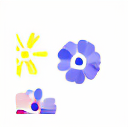

In [190]:
to_imgrid(images[6])

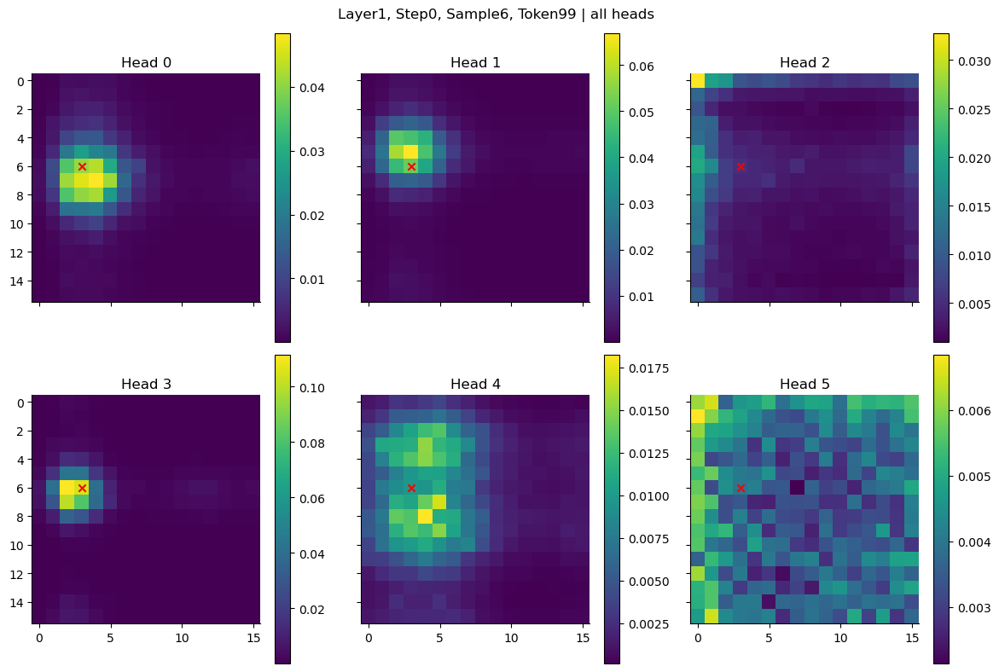

In [191]:
visualize_attn_map(attn_maps_stacked, layer_idx=1, step_idx=0, sample_idx=6, head_idx=None, token_idx=99);

#### Layer x Attention head

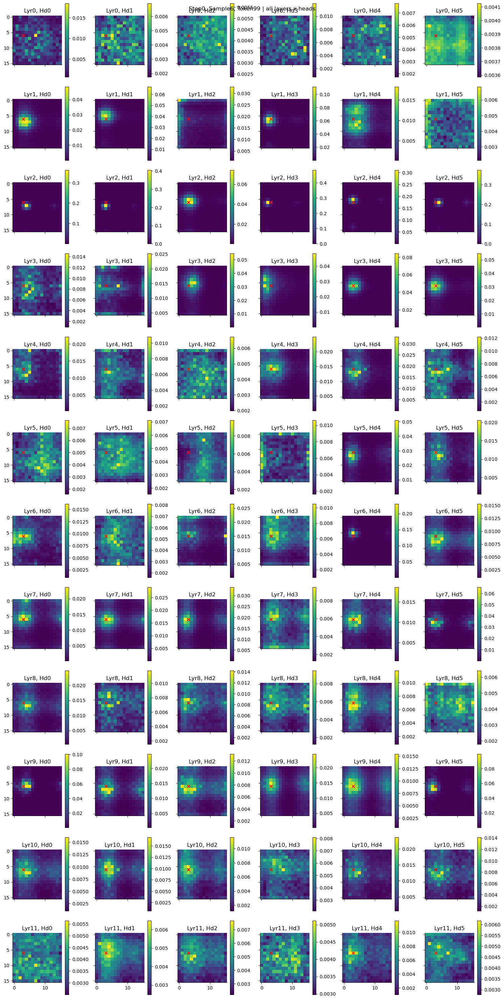

In [192]:
visualize_attn_map(attn_maps_stacked, layer_idx=None, step_idx=0, sample_idx=6, head_idx=None, token_idx=99);

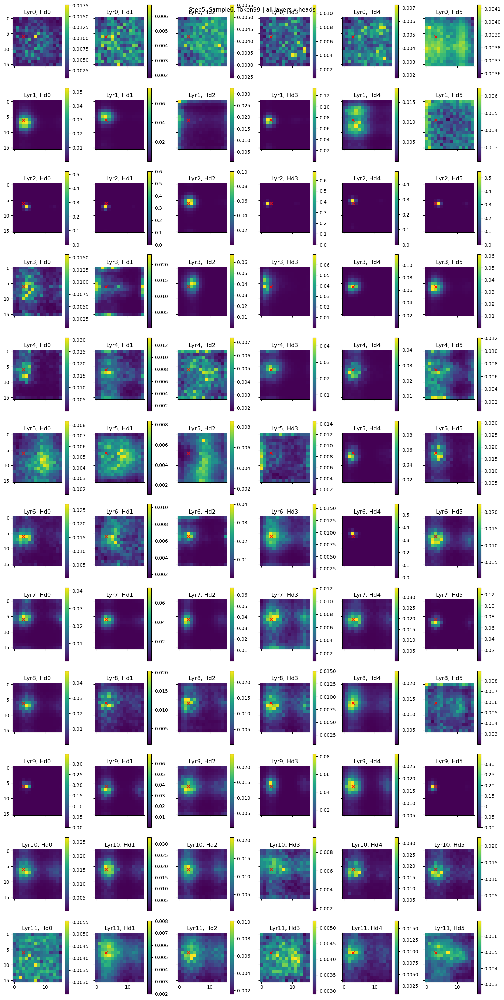

In [193]:
visualize_attn_map(attn_maps_stacked, layer_idx=None, step_idx=5, sample_idx=6, head_idx=None, token_idx=99);

#### Step x Attention head

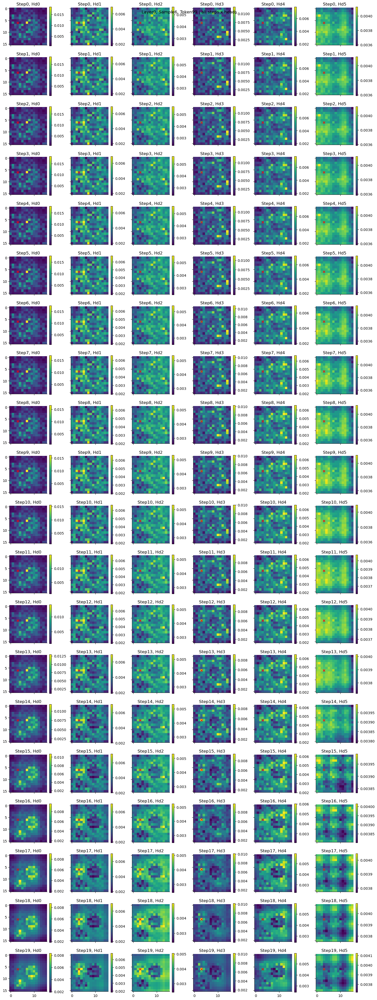

In [213]:
visualize_attn_map(attn_maps_stacked, layer_idx=0, step_idx=None, sample_idx=6, head_idx=None, token_idx=99);

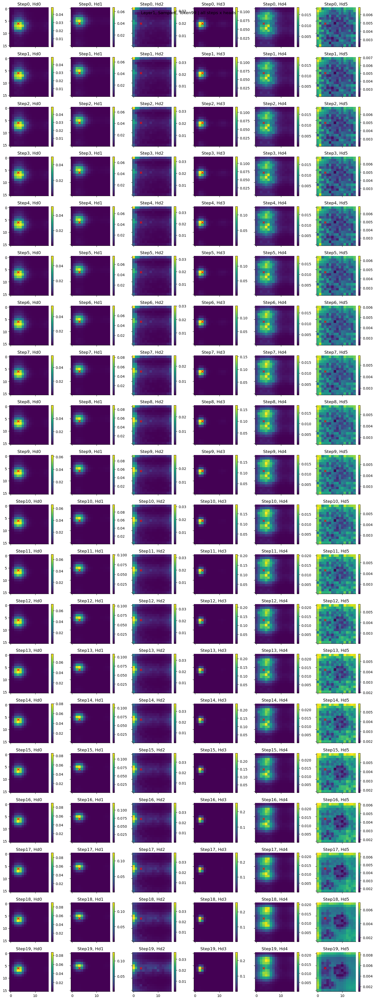

In [194]:
visualize_attn_map(attn_maps_stacked, layer_idx=1, step_idx=None, sample_idx=6, head_idx=None, token_idx=99);

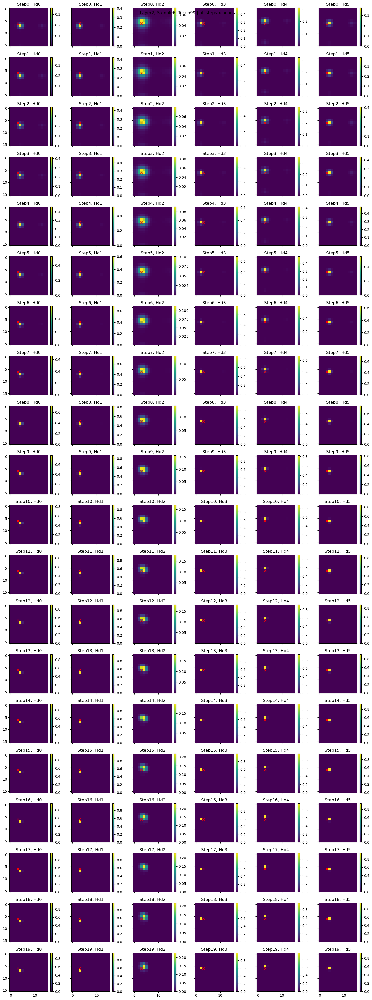

In [214]:
visualize_attn_map(attn_maps_stacked, layer_idx=2, step_idx=None, sample_idx=6, head_idx=None, token_idx=99);

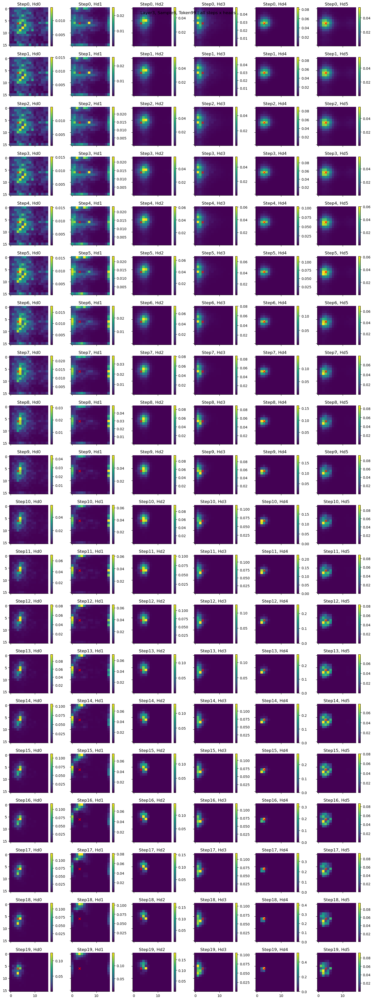

In [195]:
visualize_attn_map(attn_maps_stacked, layer_idx=3, step_idx=None, sample_idx=6, head_idx=None, token_idx=99);

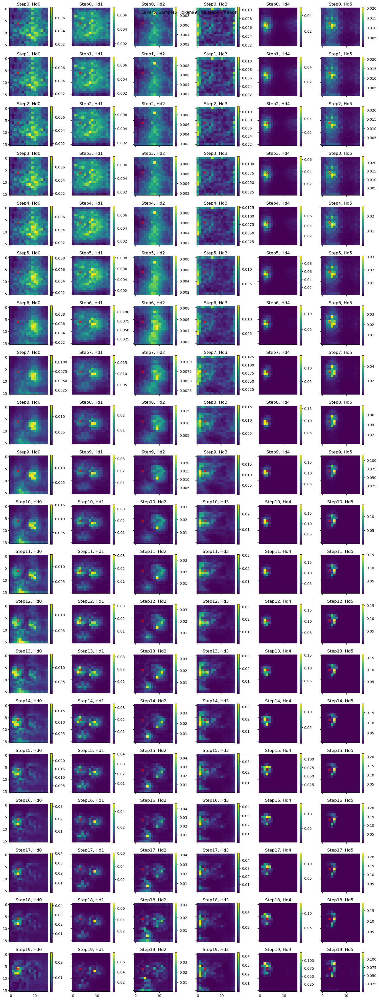

In [196]:
visualize_attn_map(attn_maps_stacked, layer_idx=5, step_idx=None, sample_idx=6, head_idx=None, token_idx=99);

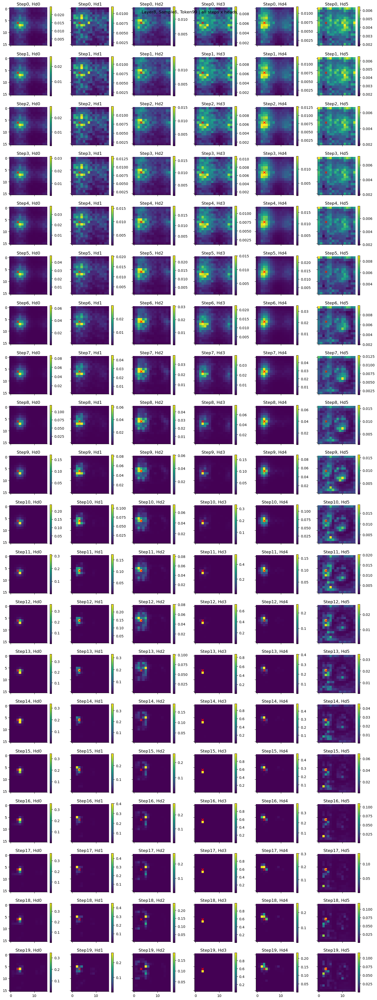

In [197]:
visualize_attn_map(attn_maps_stacked, layer_idx=8, step_idx=None, sample_idx=6, head_idx=None, token_idx=99);

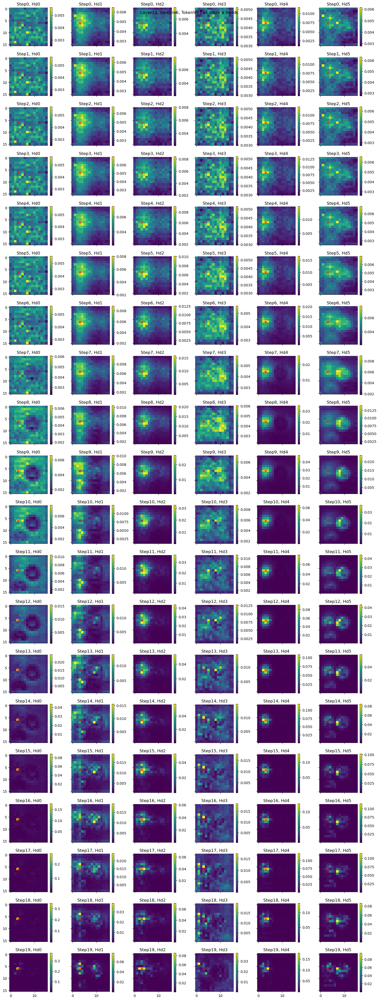

In [198]:
visualize_attn_map(attn_maps_stacked, layer_idx=11, step_idx=None, sample_idx=6, head_idx=None, token_idx=99);

## Compute some statistics of attention maps

### Entropy

In [81]:
def compute_entropy_last_dim(p: torch.Tensor, dim: int = -1) -> torch.Tensor:
    """
    Compute Shannon entropy H(p) = -sum p*log(p) along `dim`,
    treating 0·log(0) = 0 exactly.
    """
    # compute log(p) but set log(0)→0 so that 0·log(0)=0
    log_p = torch.where(p > 0, torch.log(p), torch.zeros_like(p))
    return -(p * log_p).sum(dim)

# Example usage with attention maps
# Compute entropy for each attention head at each sampling step
attn_entropy = compute_entropy_last_dim(attn_maps_stacked)  # Shape: (num_layers, num_sampling_steps, batch_size, num_heads, num_tokens)
print("Attention entropy shape:", attn_entropy.shape)
mean_attn_entropy = attn_entropy.mean(dim=-1) # (num_layers, num_sampling_steps, batch_size, num_heads)
print("Mean entropy across tokens:", mean_attn_entropy.shape)

Attention entropy shape: torch.Size([12, 20, 16, 6, 256])
Mean entropy across tokens: torch.Size([12, 20, 16, 6])


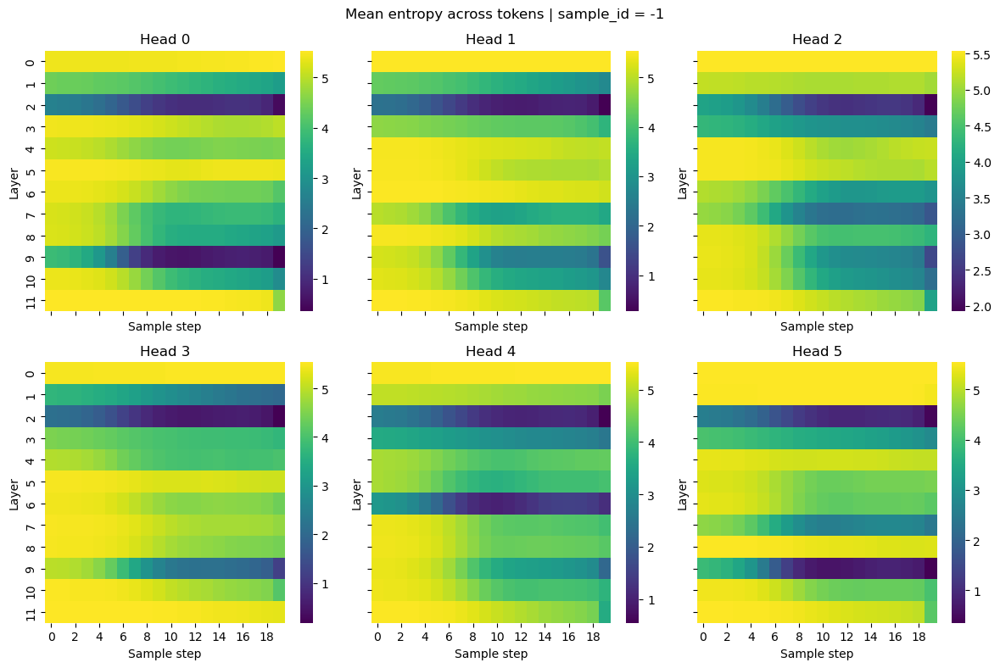

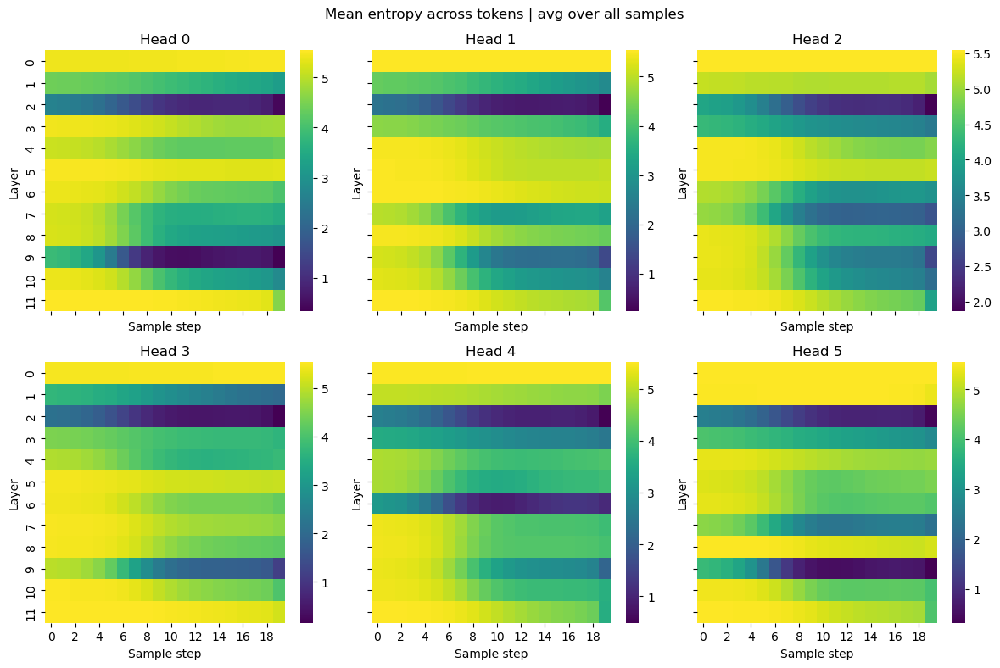

In [83]:
sample_idx = -1
figh, axs = plt.subplots(2, 3, figsize=(12, 8), sharex=True, sharey=True)
axs = axs.flatten()
for head_idx in range(6):
    sns.heatmap(mean_attn_entropy.cpu().numpy()[:,:, sample_idx, head_idx], cmap="viridis", ax=axs[head_idx], cbar=True)
    axs[head_idx].set_title(f"Head {head_idx}")
    axs[head_idx].set_xlabel("Sample step")
    axs[head_idx].set_ylabel("Layer")
plt.suptitle(f"Mean entropy across tokens | sample_id = {sample_idx}")
plt.tight_layout()
plt.show()
figh, axs = plt.subplots(2, 3, figsize=(12, 8), sharex=True, sharey=True)
axs = axs.flatten()
for head_idx in range(6):
    sns.heatmap(mean_attn_entropy.cpu()[:, :, :, head_idx].mean(dim=2), cmap="viridis", ax=axs[head_idx], cbar=True)
    axs[head_idx].set_title(f"Head {head_idx}")
    axs[head_idx].set_xlabel("Sample step")
    axs[head_idx].set_ylabel("Layer")
plt.suptitle(f"Mean entropy across tokens | avg over all samples")
plt.tight_layout()
plt.show()

### Top 1 score

In [85]:
attn_top1_score = attn_maps_stacked.max(dim=-1).values  # Shape: (num_layers, num_sampling_steps, batch_size, num_heads, num_tokens)
print("Attention top1 score shape:", attn_top1_score.shape)
mean_attn_top1_score = attn_top1_score.mean(dim=-1) # (num_layers, num_sampling_steps, batch_size, num_heads)
print("Mean top1 score across tokens:", mean_attn_top1_score.shape)

Attention top1 score shape: torch.Size([12, 20, 16, 6, 256])
Mean top1 score across tokens: torch.Size([12, 20, 16, 6])


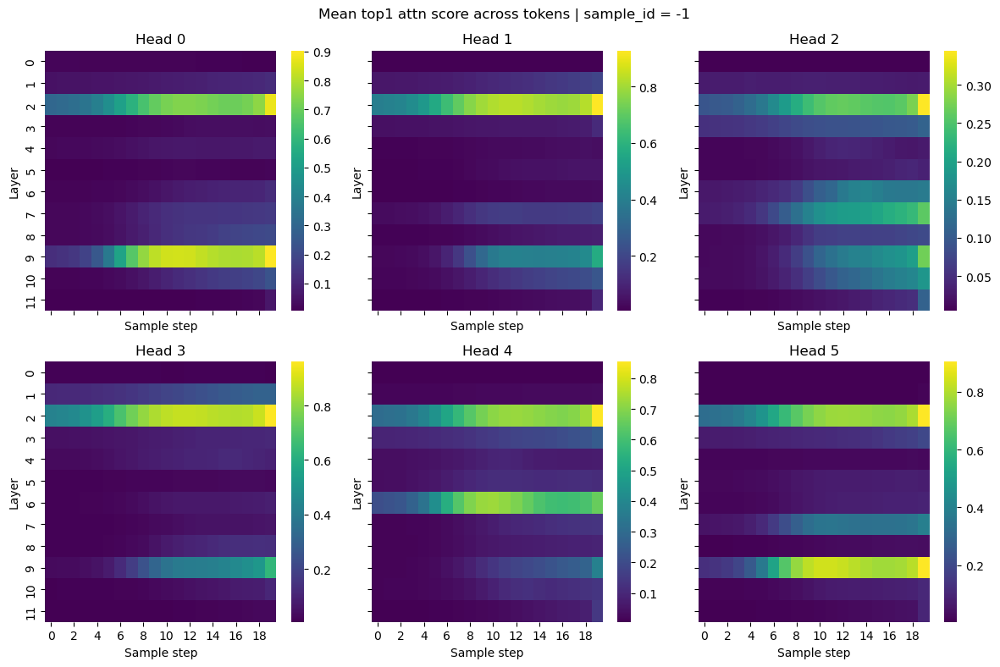

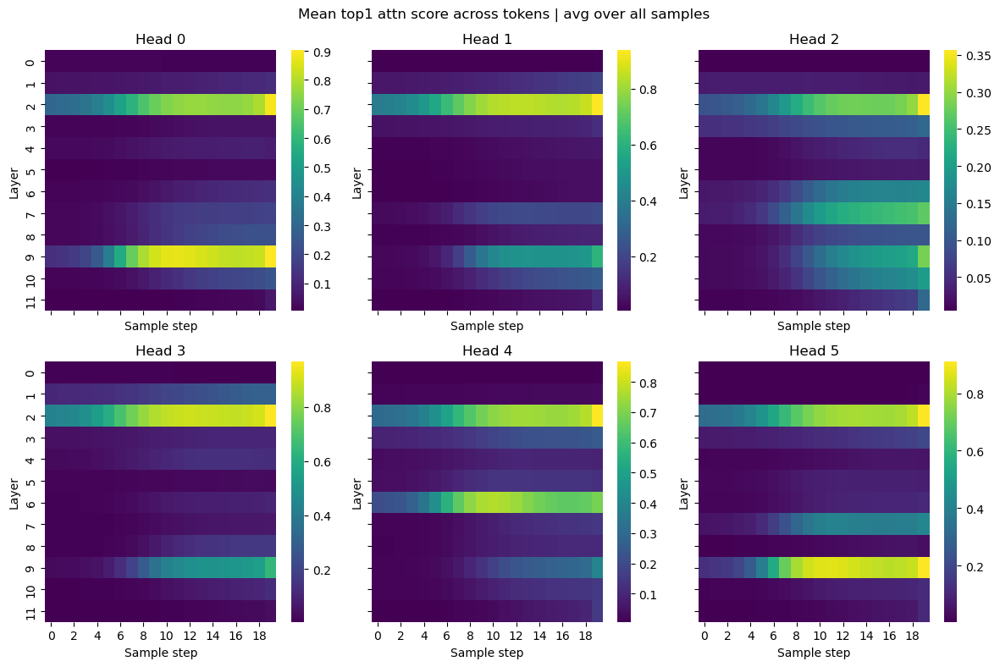

In [87]:
sample_idx = -1
figh, axs = plt.subplots(2, 3, figsize=(12, 8), sharex=True, sharey=True)
axs = axs.flatten()
for head_idx in range(6):
    sns.heatmap(mean_attn_top1_score.cpu().numpy()[:,:, sample_idx, head_idx], cmap="viridis", ax=axs[head_idx], cbar=True)
    axs[head_idx].set_title(f"Head {head_idx}")
    axs[head_idx].set_xlabel("Sample step")
    axs[head_idx].set_ylabel("Layer")
plt.suptitle(f"Mean top1 attn score across tokens | sample_id = {sample_idx}")
plt.tight_layout()
plt.show()
figh, axs = plt.subplots(2, 3, figsize=(12, 8), sharex=True, sharey=True)
axs = axs.flatten()
for head_idx in range(6):
    sns.heatmap(mean_attn_top1_score.cpu()[:, :, :, head_idx].mean(dim=2), cmap="viridis", ax=axs[head_idx], cbar=True)
    axs[head_idx].set_title(f"Head {head_idx}")
    axs[head_idx].set_xlabel("Sample step")
    axs[head_idx].set_ylabel("Layer")
plt.suptitle(f"Mean top1 attn score across tokens | avg over all samples")
plt.tight_layout()
plt.show()

### Compute avg Attention span (avg distance)

In [ ]:
import torch 
import numpy as np
def _token_distance_matrix(shape=(16, 16)):
    """
    Compute a matrix of distances between all tokens in a grid of shape `shape`.
    The distance between two tokens is the Euclidean distance between their coordinates.
    """
    x, y = torch.meshgrid(torch.arange(shape[0]), torch.arange(shape[1]))
    pos_vec = torch.stack([x.flatten(), y.flatten()], dim=1).float()
    return torch.cdist(pos_vec, pos_vec, p=2)

dist_matrix = _token_distance_matrix(shape=(16, 16)) # n_tokens x n_tokens


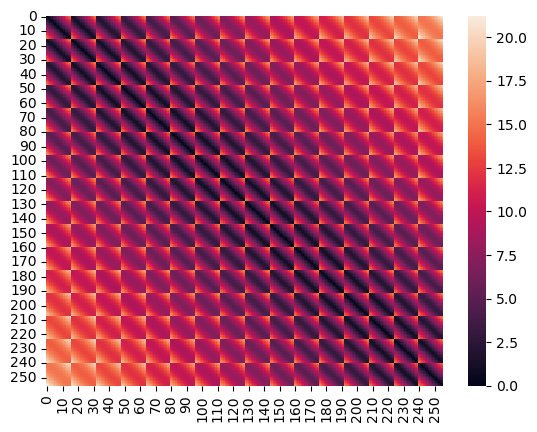

In [71]:
sns.heatmap(dist_matrix)
plt.show()

In [72]:
assert torch.allclose(dist_matrix.max(), 15 * torch.sqrt(2.0*torch.ones(2)))

In [210]:
attn_avg_L2dist_stacked = (attn_maps_stacked * dist_matrix).sum(dim=-1).mean(dim=-1)
attn_avg_sq_L2dist_stacked = (attn_maps_stacked * dist_matrix**2).sum(dim=-1).mean(dim=-1)

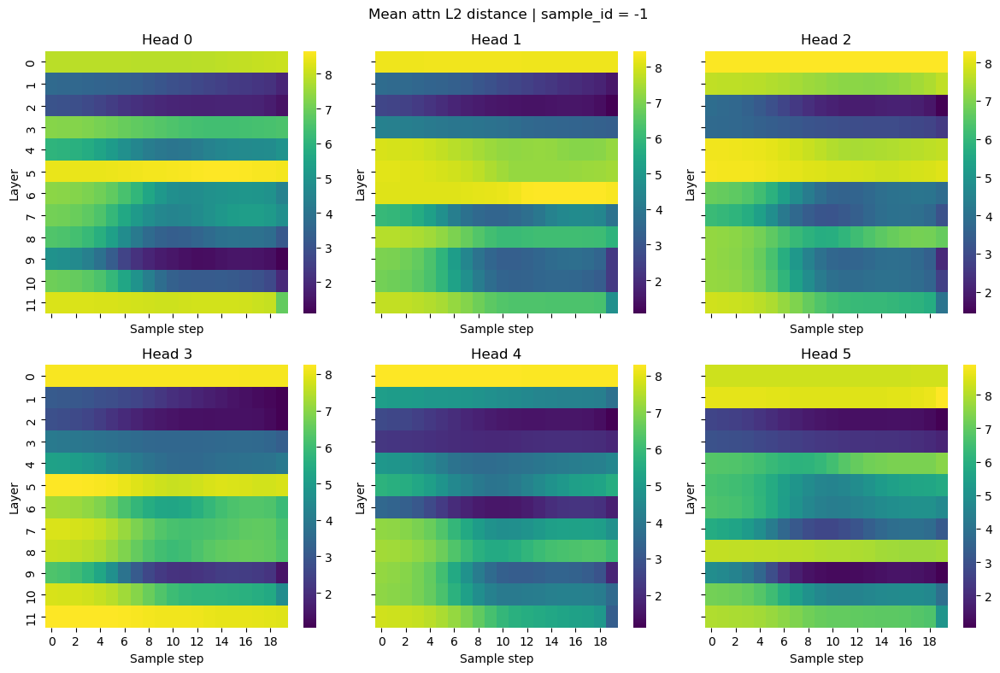

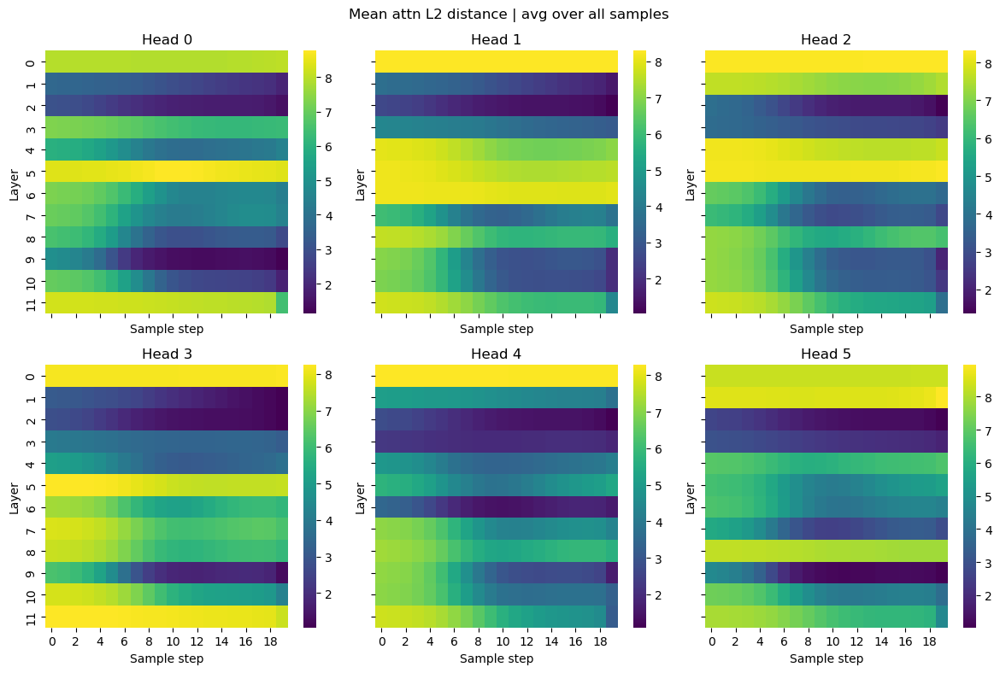

In [211]:
figh, axs = plt.subplots(2, 3, figsize=(12, 8), sharex=True, sharey=True)
axs = axs.flatten()
for head_idx in range(6):
    sns.heatmap(attn_avg_L2dist_stacked.cpu()[:, :, -1, head_idx], cmap="viridis", ax=axs[head_idx], cbar=True)
    axs[head_idx].set_title(f"Head {head_idx}")
    axs[head_idx].set_xlabel("Sample step")
    axs[head_idx].set_ylabel("Layer")
plt.suptitle(f"Mean attn L2 distance | sample_id = -1")
plt.tight_layout()
plt.show()
figh, axs = plt.subplots(2, 3, figsize=(12, 8), sharex=True, sharey=True)
axs = axs.flatten()
for head_idx in range(6):
    sns.heatmap(attn_avg_L2dist_stacked.cpu()[:, :, :, head_idx].mean(dim=2), cmap="viridis", ax=axs[head_idx], cbar=True)
    axs[head_idx].set_title(f"Head {head_idx}")
    axs[head_idx].set_xlabel("Sample step")
    axs[head_idx].set_ylabel("Layer")
plt.suptitle(f"Mean attn L2 distance | avg over all samples")
plt.tight_layout()
plt.show()

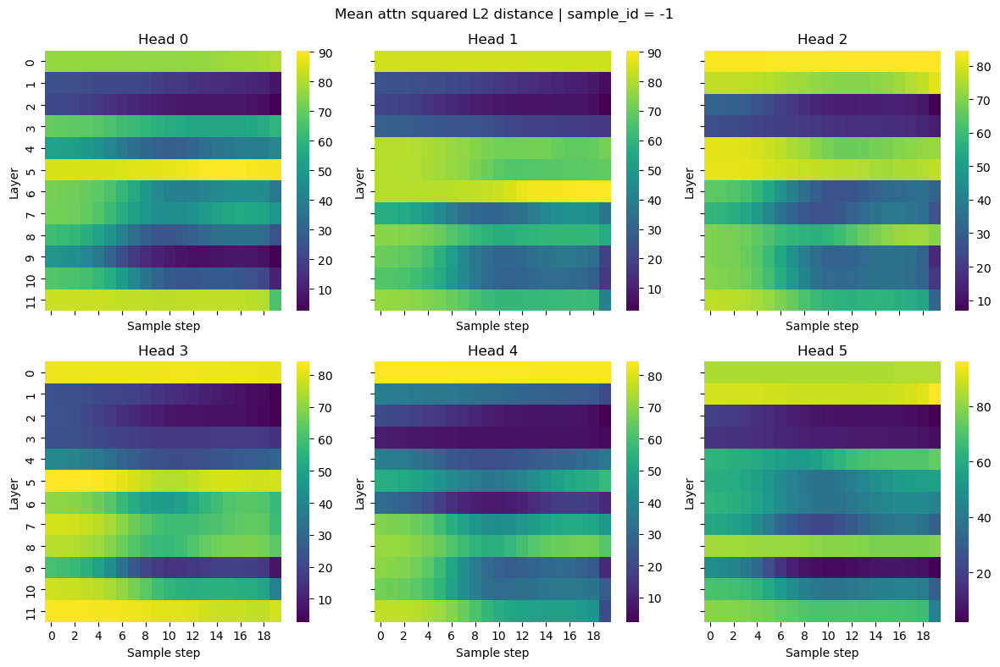

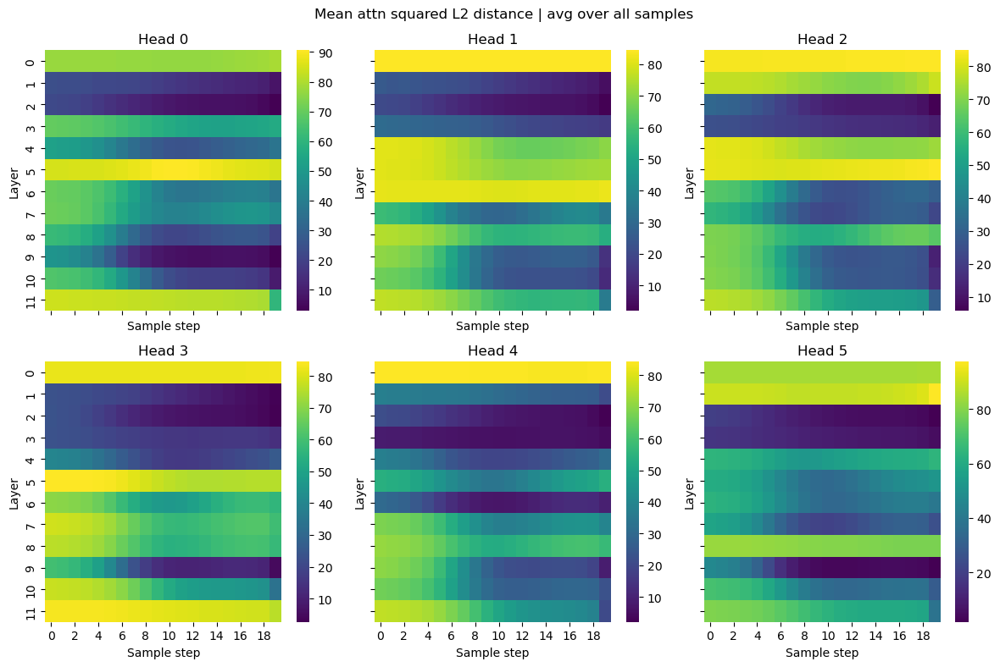

In [212]:
figh, axs = plt.subplots(2, 3, figsize=(12, 8), sharex=True, sharey=True)
axs = axs.flatten()
for head_idx in range(6):
    sns.heatmap(attn_avg_sq_L2dist_stacked.cpu()[:, :, -1, head_idx], cmap="viridis", ax=axs[head_idx], cbar=True)
    axs[head_idx].set_title(f"Head {head_idx}")
    axs[head_idx].set_xlabel("Sample step")
    axs[head_idx].set_ylabel("Layer")
plt.suptitle(f"Mean attn squared L2 distance | sample_id = -1")
plt.tight_layout()
plt.show()
figh, axs = plt.subplots(2, 3, figsize=(12, 8), sharex=True, sharey=True)
axs = axs.flatten()
for head_idx in range(6):
    sns.heatmap(attn_avg_sq_L2dist_stacked.cpu()[:, :, :, head_idx].mean(dim=2), cmap="viridis", ax=axs[head_idx], cbar=True)
    axs[head_idx].set_title(f"Head {head_idx}")
    axs[head_idx].set_xlabel("Sample step")
    axs[head_idx].set_ylabel("Layer")
plt.suptitle(f"Mean attn squared L2 distance | avg over all samples")
plt.tight_layout()
plt.show()

### Compute the local window attention

In [97]:
radius = 1.0
locality_mask = (dist_matrix < radius).float()
attn_local_score_mean = (attn_maps_stacked * locality_mask).sum(dim=-1).mean(-1)

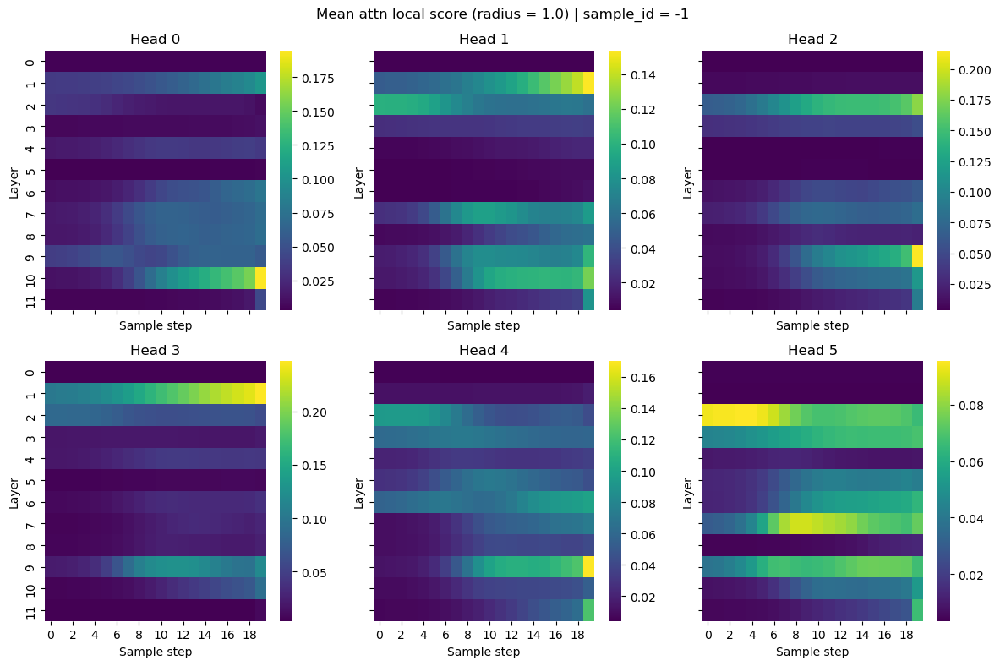

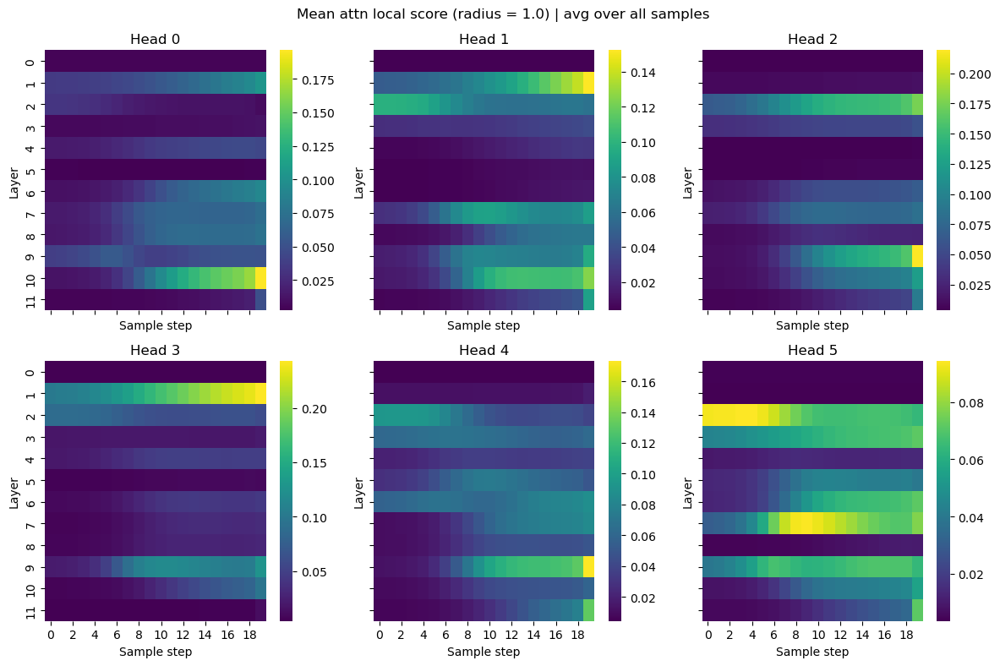

In [99]:
figh, axs = plt.subplots(2, 3, figsize=(12, 8), sharex=True, sharey=True)
axs = axs.flatten()
for head_idx in range(6):
    sns.heatmap(attn_local_score_mean.cpu()[:, :, -1, head_idx], cmap="viridis", ax=axs[head_idx], cbar=True)
    axs[head_idx].set_title(f"Head {head_idx}")
    axs[head_idx].set_xlabel("Sample step")
    axs[head_idx].set_ylabel("Layer")
plt.suptitle(f"Mean attn local score (radius = {radius}) | sample_id = -1")
plt.tight_layout()
plt.show()
figh, axs = plt.subplots(2, 3, figsize=(12, 8), sharex=True, sharey=True)
axs = axs.flatten()
for head_idx in range(6):
    sns.heatmap(attn_local_score_mean.cpu()[:, :, :, head_idx].mean(dim=2), cmap="viridis", ax=axs[head_idx], cbar=True)
    axs[head_idx].set_title(f"Head {head_idx}")
    axs[head_idx].set_xlabel("Sample step")
    axs[head_idx].set_ylabel("Layer")
plt.suptitle(f"Mean attn local score (radius = {radius}) | avg over all samples")
plt.tight_layout()
plt.show()

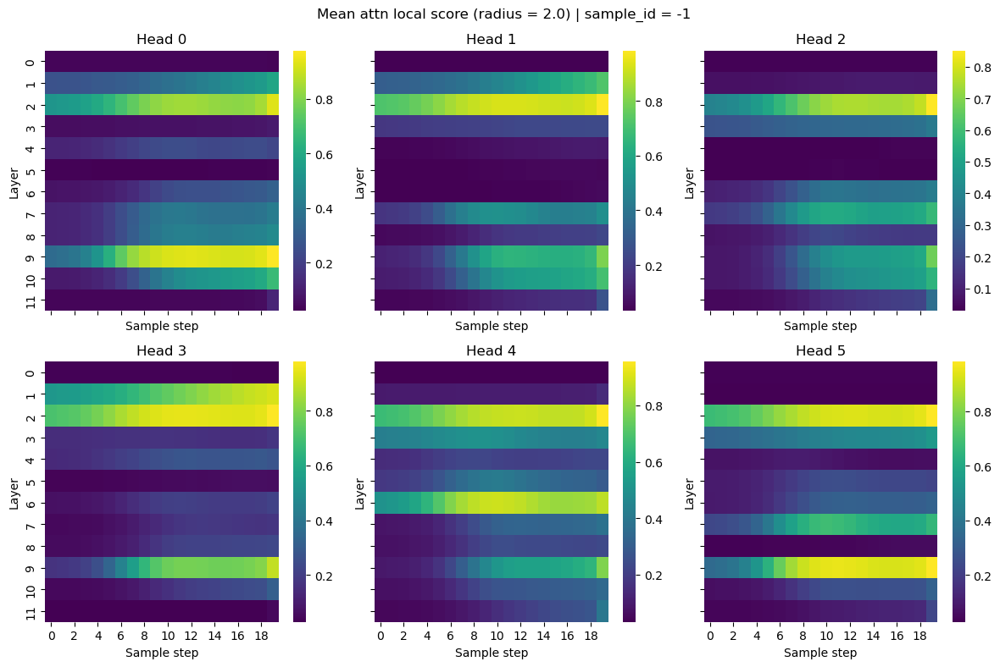

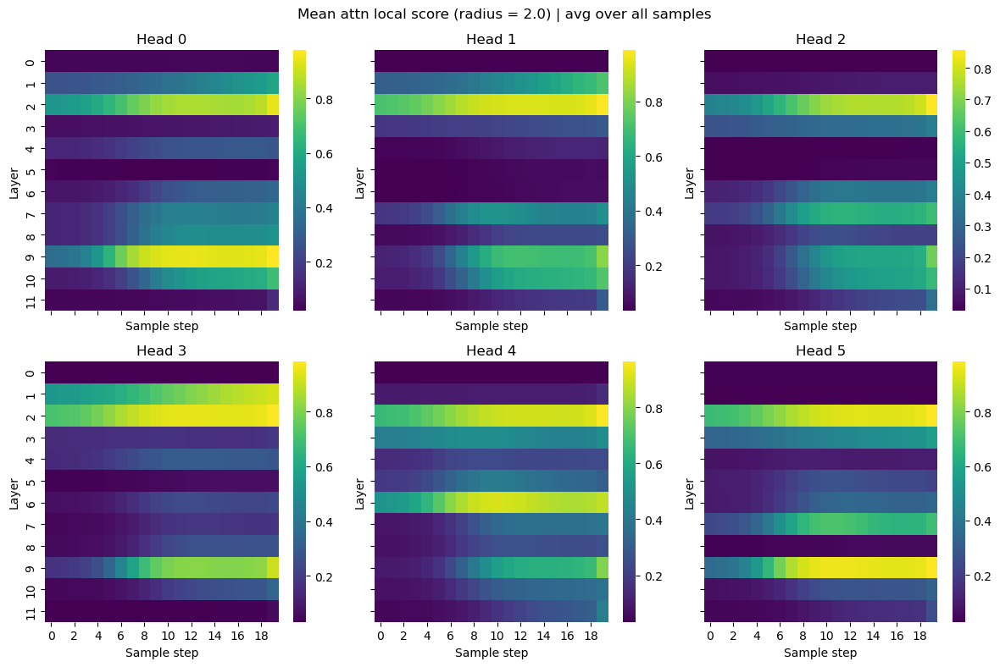

In [96]:
figh, axs = plt.subplots(2, 3, figsize=(12, 8), sharex=True, sharey=True)
axs = axs.flatten()
for head_idx in range(6):
    sns.heatmap(attn_local_score_mean.cpu()[:, :, -1, head_idx], cmap="viridis", ax=axs[head_idx], cbar=True)
    axs[head_idx].set_title(f"Head {head_idx}")
    axs[head_idx].set_xlabel("Sample step")
    axs[head_idx].set_ylabel("Layer")
plt.suptitle(f"Mean attn local score (radius = {radius}) | sample_id = -1")
plt.tight_layout()
plt.show()
figh, axs = plt.subplots(2, 3, figsize=(12, 8), sharex=True, sharey=True)
axs = axs.flatten()
for head_idx in range(6):
    sns.heatmap(attn_local_score_mean.cpu()[:, :, :, head_idx].mean(dim=2), cmap="viridis", ax=axs[head_idx], cbar=True)
    axs[head_idx].set_title(f"Head {head_idx}")
    axs[head_idx].set_xlabel("Sample step")
    axs[head_idx].set_ylabel("Layer")
plt.suptitle(f"Mean attn local score (radius = {radius}) | avg over all samples")
plt.tight_layout()
plt.show()

### Clusteringness and Smoothness

In [117]:
def weighted_variance_2d(A: torch.Tensor) -> torch.Tensor:
    """
    A: (..., H, W), rows sum to 1
    returns: (...) det(cov)^{-1/2}  (a scalar per map)
    """
    H, W = A.shape[-2:]
    ys = torch.arange(H, device=A.device, dtype=A.dtype).view(-1,1)
    xs = torch.arange(W, device=A.device, dtype=A.dtype).view(1,-1)
    # normalize A so it sums to 1 per map
    P = A / (A.sum(dim=(-2,-1), keepdim=True) + 1e-12)
    mu_y = (P * ys).sum(dim=(-2,-1), keepdim=True)
    mu_x = (P * xs).sum(dim=(-2,-1), keepdim=True)
    dy = ys - mu_y; dx = xs - mu_x
    # compute cov matrix entries
    c_yy = (P * dy * dy).sum(dim=(-2,-1))
    c_xx = (P * dx * dx).sum(dim=(-2,-1))
    c_xy = (P * dy * dx).sum(dim=(-2,-1))
    # det of covariance
    det = c_yy * c_xx - c_xy**2
    return det 
    
def clusteriness_2d(A: torch.Tensor) -> torch.Tensor:
    """
    A: (..., H, W), rows sum to 1
    returns: (...) det(cov)^{-1/2}  (a scalar per map)
    """
    return 1.0 / (weighted_variance_2d(A) + 1e-12)

In [ ]:
H, W = 16, 16
attn_maps_stacked_spatial = attn_maps_stacked.reshape(*attn_maps_stacked.shape[:-1], H, W)
attn_maps_stacked_clusteriness = clusteriness_2d(attn_maps_stacked_spatial)
attn_maps_stacked_clusteriness.shape
attn_maps_stacked_clusteriness_mean = attn_maps_stacked_clusteriness.mean(dim=-1)

In [118]:
H, W = 16, 16
attn_maps_stacked_spatial = attn_maps_stacked.reshape(*attn_maps_stacked.shape[:-1], H, W)
attn_maps_stacked_weighted_variance = weighted_variance_2d(attn_maps_stacked_spatial)
attn_maps_stacked_weighted_variance.shape
attn_maps_stacked_weighted_variance_mean = attn_maps_stacked_weighted_variance.mean(dim=-1)

In [112]:
import torch

def tv2d(A: torch.Tensor) -> torch.Tensor:
    """
    Total variation of A along its last two dims.
    Lower TV ⇒ smoother.
    Returns shape A.shape[:-2].
    """
    dh = (A[..., 1:, :] - A[..., :-1, :]).abs().sum(dim=(-2, -1))
    dw = (A[..., :, 1:] - A[..., :, :-1]).abs().sum(dim=(-2, -1))
    return dh + dw

In [113]:
attn_maps_stacked_tv = tv2d(attn_maps_stacked_spatial)
attn_maps_stacked_tv_mean = attn_maps_stacked_tv.mean(dim=-1)

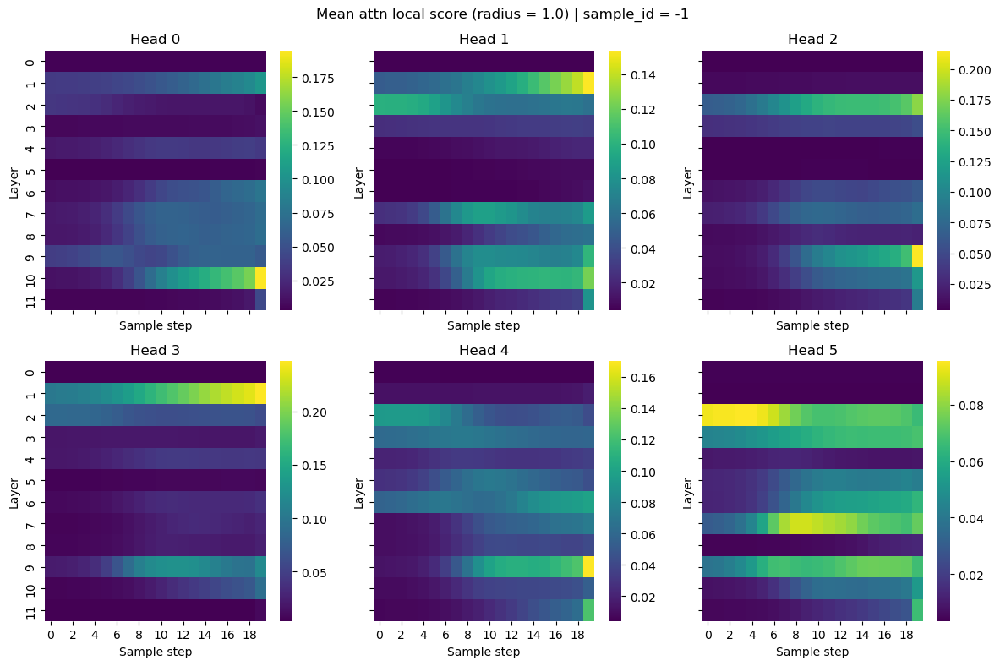

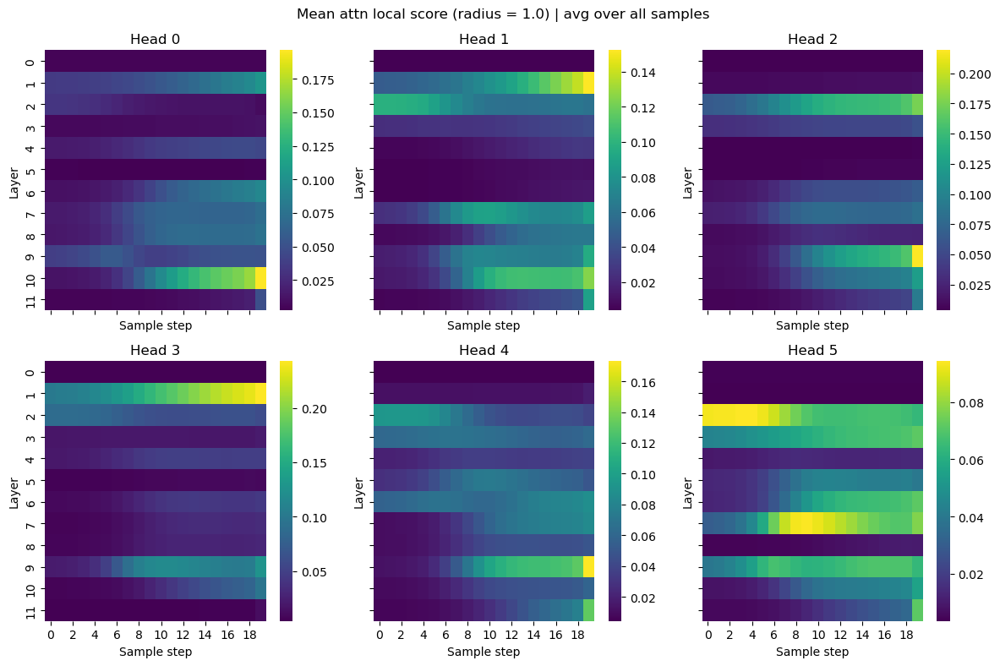

In [201]:
def plot_attention_heatmaps(score_tensor, title_str, figsize=(12, 8), sample_idx=-1, num_heads=6):
    """
    Plot attention heatmaps for multiple heads.
    
    Args:
        score_tensor: Tensor of shape (layers, steps, samples, heads) or (layers, steps, heads)
        title_str: Title string for the plot
        figsize: Figure size tuple
        num_heads: Number of attention heads to plot
    """
    figh, axs = plt.subplots(2, 3, figsize=figsize, sharex=True, sharey=True)
    axs = axs.flatten()
    num_heads = score_tensor.shape[-1]
    for head_idx in range(num_heads):
        if sample_idx is not None:  # (layers, steps, samples, heads)
            data = score_tensor.cpu()[:, :, sample_idx, head_idx]  # Last sample
        else:  # (layers, steps, heads)
            data = score_tensor.cpu()[:, :, :, head_idx].mean(dim=2)
            
        sns.heatmap(data, cmap="viridis", ax=axs[head_idx], cbar=True)
        axs[head_idx].set_title(f"Head {head_idx}")
        axs[head_idx].set_xlabel("Sample step")
        axs[head_idx].set_ylabel("Layer")
    
    plt.suptitle(title_str+(f" | sample_id = {sample_idx}" if sample_idx is not None else " | avg over all samples"))
    plt.tight_layout()
    plt.show()

# Plot last sample
plot_attention_heatmaps(
    attn_local_score_mean,  f"Mean attn local score (radius = {radius})", sample_idx=-1
)
# Plot average over all samples
plot_attention_heatmaps(
    attn_local_score_mean,  f"Mean attn local score (radius = {radius})", sample_idx=None
)

In [110]:
attn_maps_stacked_tv_mean.shape

torch.Size([12, 20, 16, 6, 256])

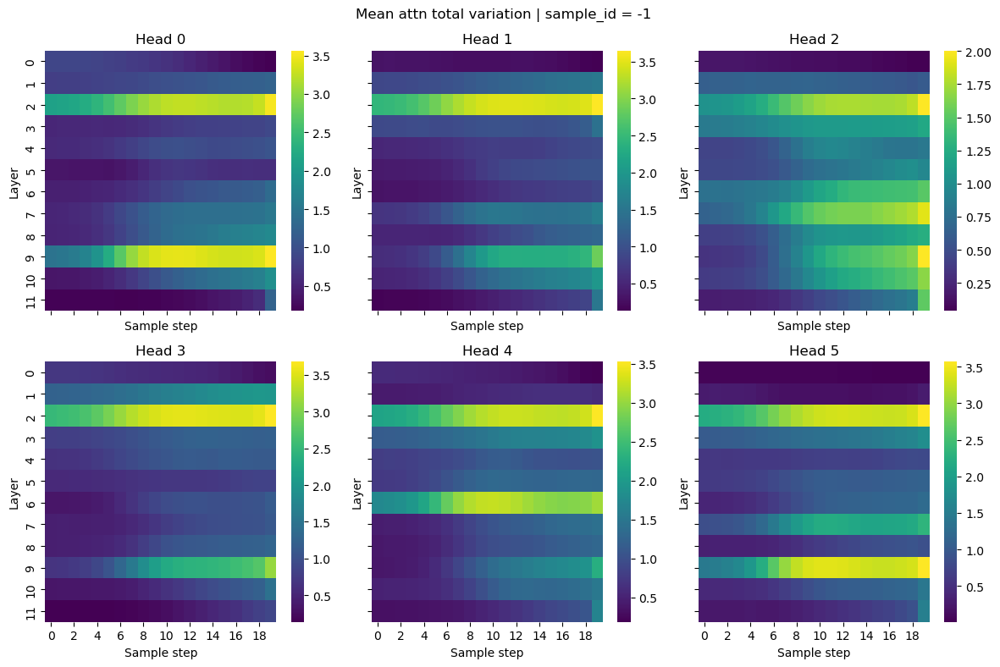

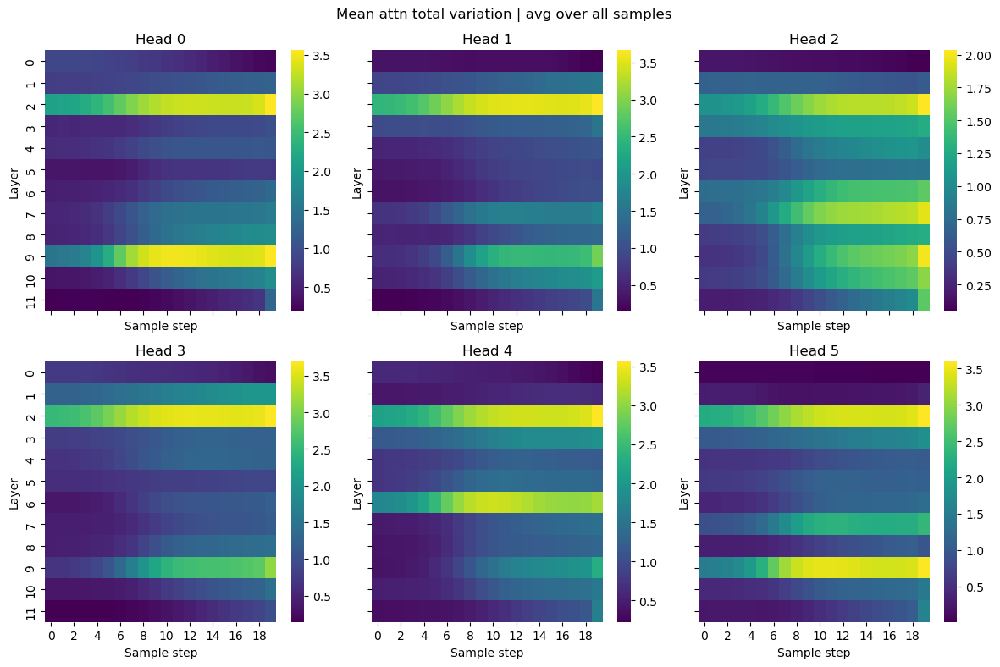

In [202]:
# Plot last sample
plot_attention_heatmaps(attn_maps_stacked_tv_mean,  f"Mean attn total variation", sample_idx=-1)
# Plot average over all samples
plot_attention_heatmaps(attn_maps_stacked_tv_mean,  f"Mean attn total variation", sample_idx=None)

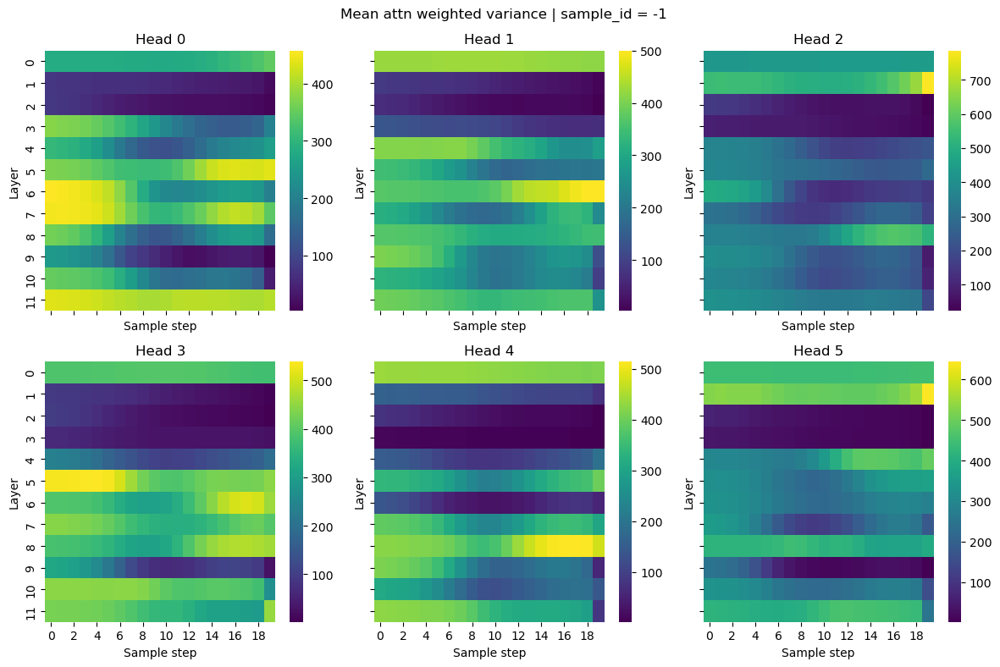

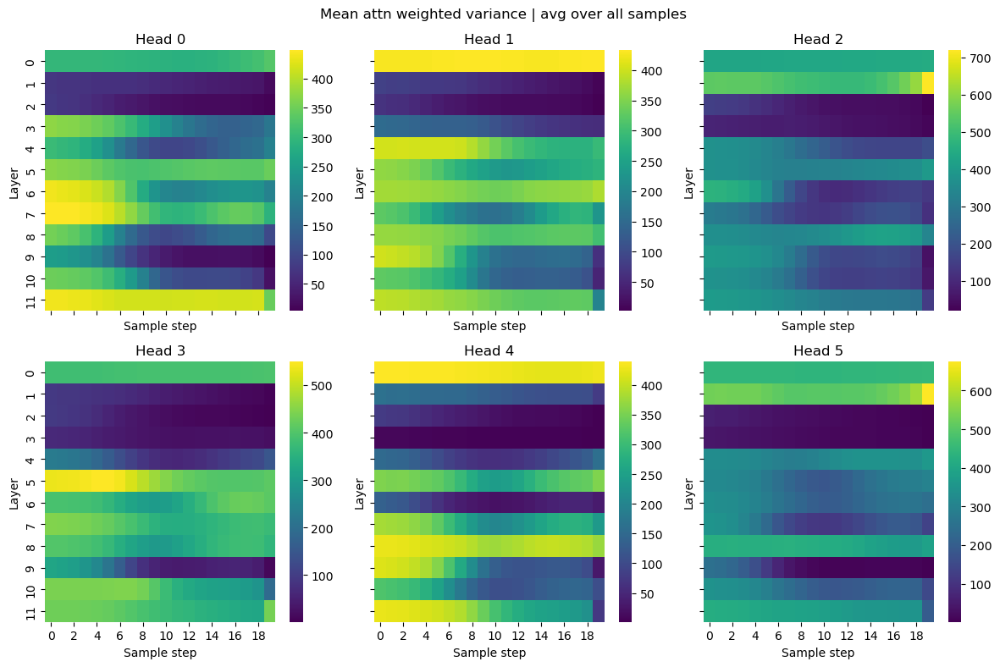

In [203]:
# Plot last sample
plot_attention_heatmaps(attn_maps_stacked_weighted_variance_mean,  f"Mean attn weighted variance", sample_idx=-1)
# Plot average over all samples
plot_attention_heatmaps(attn_maps_stacked_weighted_variance_mean,  f"Mean attn weighted variance", sample_idx=None)

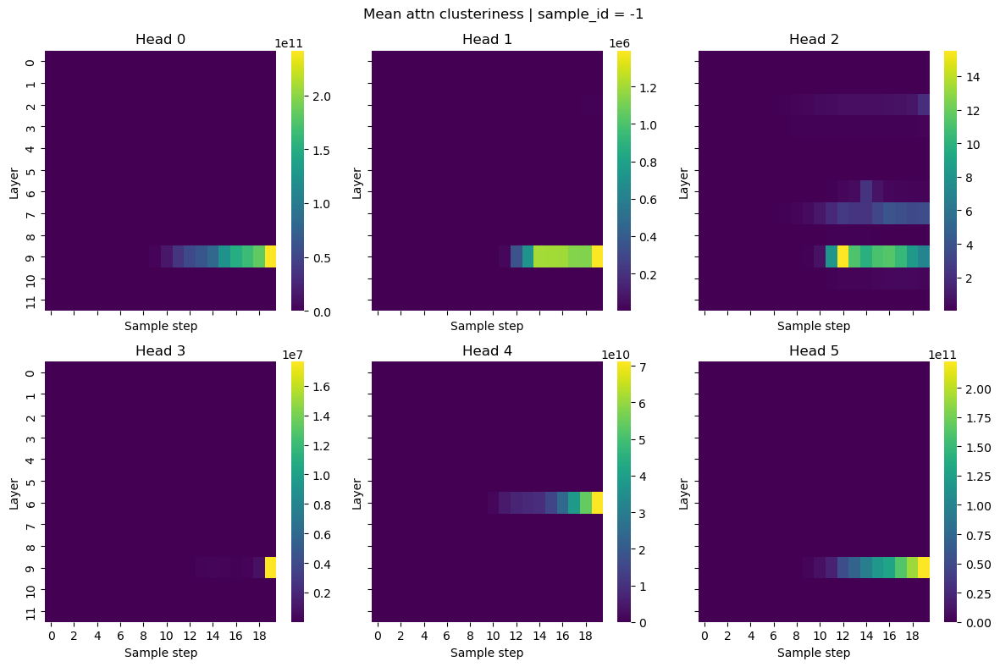

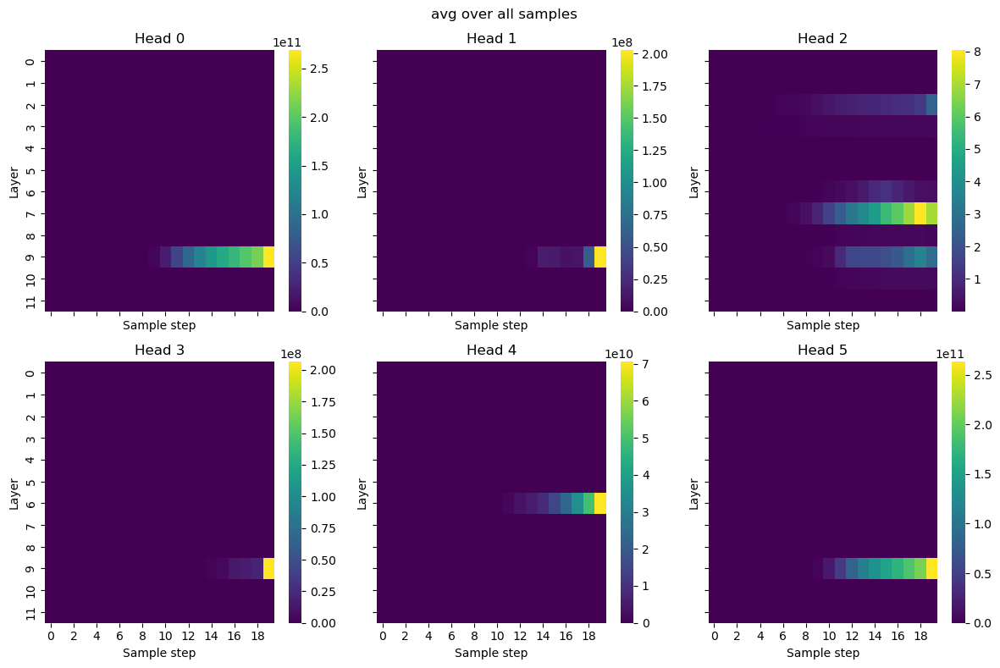

In [116]:
# Plot last sample
plot_attention_heatmaps(attn_maps_stacked_clusteriness_mean,  f"Mean attn clusteriness", sample_idx=-1)
# Plot average over all samples
plot_attention_heatmaps(attn_maps_stacked_clusteriness_mean,  f"Mean attn clusteriness", sample_idx=None)

In [207]:
attn_maps_stacked_min = attn_maps_stacked.min(dim=-1).values.unsqueeze(-1)
attn_maps_stacked_max = attn_maps_stacked.max(dim=-1).values.unsqueeze(-1)
attn_maps_stacked_minmax_norm = (attn_maps_stacked - attn_maps_stacked_min) / (attn_maps_stacked_max - attn_maps_stacked_min)

attn_maps_stacked_spatial_minmax_norm = attn_maps_stacked_minmax_norm.reshape(*attn_maps_stacked_minmax_norm.shape[:-1], 16, 16)
attn_maps_stacked_tv_minmax_norm = tv2d(attn_maps_stacked_spatial_minmax_norm)
attn_maps_stacked_tv_minmax_norm_mean = attn_maps_stacked_tv_minmax_norm.mean(dim=-1)


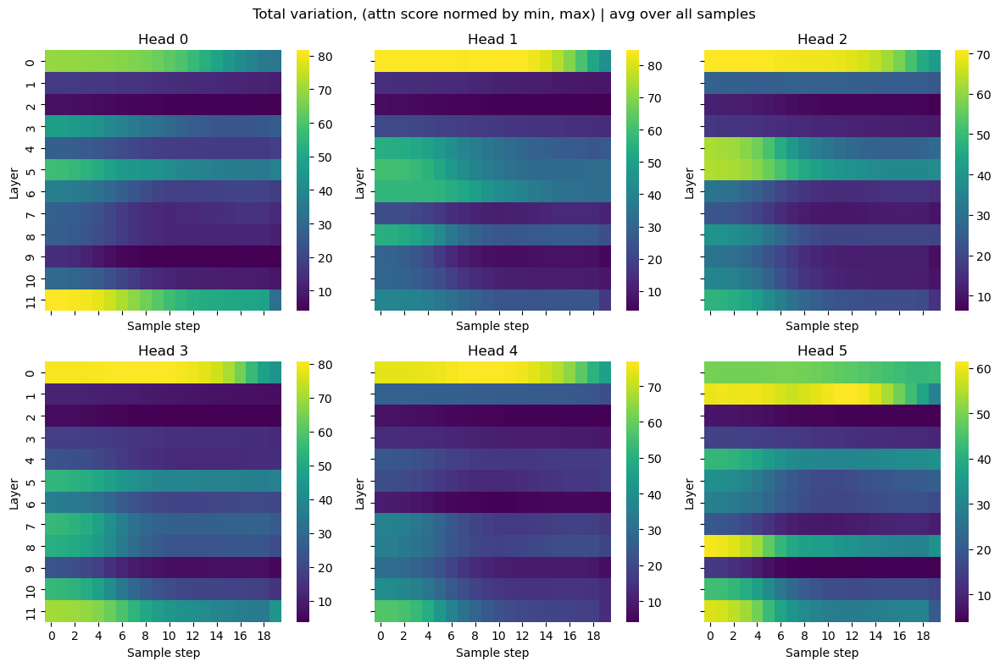

In [209]:

plot_attention_heatmaps(
    attn_maps_stacked_tv_minmax_norm_mean,  f"Total variation, (attn score normed by min, max)", sample_idx=None
)